In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

In [3]:
data = pd.read_excel('32_052019.xlsx')
df = data.copy()

df

,Код станции отправления,Станция отправления,Регион отгрузки,Ж/Д отгрузки,Отд. ж/д отгрузки,Код станции назначения,Станция назначения,Регион поставки,Ж/Д поставки,Отд. ж/д поставки,...,Станция отправления загран,Код станции отправления загран,Станция назначения загран,Код станции назначения загран,Отч мес,Отч год,Код страны отправления,Страна отправления,Код страны назначения,Страна назначения
0,86420,НОВОКУЗНЕЦК-СЕВЕРНЫЙ,КЕМЕРОВСКАЯ ОБЛАСТЬ,Западно-Сибирская,HОВОКУЗHЕЦ-Е,84480,КУЛУНДА-ЭКСПОРТ (В КАЗ),АЛТАЙСКИЙ КРАЙ,Западно-Сибирская,АЛТАЙСКОЕ,...,НОВОКУЗ.-СЕВ,86420,БИШКЕК 1,71660,5,19,643,РОССИЯ,417,КИРГИЗИЯ
1,86420,НОВОКУЗНЕЦК-СЕВЕРНЫЙ,КЕМЕРОВСКАЯ ОБЛАСТЬ,Западно-Сибирская,HОВОКУЗHЕЦ-Е,84480,КУЛУНДА-ЭКСПОРТ (В КАЗ),АЛТАЙСКИЙ КРАЙ,Западно-Сибирская,АЛТАЙСКОЕ,...,НОВОКУЗ.-СЕВ,86420,БИШКЕК 1,71660,5,19,643,РОССИЯ,417,КИРГИЗИЯ
2,86420,НОВОКУЗНЕЦК-СЕВЕРНЫЙ,КЕМЕРОВСКАЯ ОБЛАСТЬ,Западно-Сибирская,HОВОКУЗHЕЦ-Е,84480,КУЛУНДА-ЭКСПОРТ (В КАЗ),АЛТАЙСКИЙ КРАЙ,Западно-Сибирская,АЛТАЙСКОЕ,...,НОВОКУЗ.-СЕВ,86420,БИШКЕК 1,71660,5,19,643,РОССИЯ,417,КИРГИЗИЯ
3,86420,НОВОКУЗНЕЦК-СЕВЕРНЫЙ,КЕМЕРОВСКАЯ ОБЛАСТЬ,Западно-Сибирская,HОВОКУЗHЕЦ-Е,84480,КУЛУНДА-ЭКСПОРТ (В КАЗ),АЛТАЙСКИЙ КРАЙ,Западно-Сибирская,АЛТАЙСКОЕ,...,НОВОКУЗ.-СЕВ,86420,АКЖАЙЫК,66160,5,19,643,РОССИЯ,398,КАЗАХСТАН
4,86420,НОВОКУЗНЕЦК-СЕВЕРНЫЙ,КЕМЕРОВСКАЯ ОБЛАСТЬ,Западно-Сибирская,HОВОКУЗHЕЦ-Е,84480,КУЛУНДА-ЭКСПОРТ (В КАЗ),АЛТАЙСКИЙ КРАЙ,Западно-Сибирская,АЛТАЙСКОЕ,...,НОВОКУЗ.-СЕВ,86420,АКЖАЙЫК,66160,5,19,643,РОССИЯ,398,КАЗАХСТАН
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36188,93460,МЫСОВАЯ,РЕСПУБЛИКА БУРЯТИЯ,Восточно-Сибирская,УЛАH-УДЕH-ОЕ,93320,АНГАСОЛКА,ИРКУТСКАЯ ОБЛАСТЬ,Восточно-Сибирская,УЛАH-УДЕH-ОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
36189,93460,МЫСОВАЯ,РЕСПУБЛИКА БУРЯТИЯ,Восточно-Сибирская,УЛАH-УДЕH-ОЕ,93460,МЫСОВАЯ,РЕСПУБЛИКА БУРЯТИЯ,Восточно-Сибирская,УЛАH-УДЕH-ОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
36190,94960,ЗИЛОВО,ЧИТИНСКАЯ ОБЛАСТЬ,Забайкальская,МОГОЧИHСКОЕ,95050,СБЕГА,ЧИТИНСКАЯ ОБЛАСТЬ,Забайкальская,МОГОЧИHСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
36191,65540,ИГЛИНО,РЕСПУБЛИКА БАШКОРТОСТАН,Куйбышевская,БАШКИРСКОЕ,65540,ИГЛИНО,РЕСПУБЛИКА БАШКОРТОСТАН,Куйбышевская,БАШКИРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ


In [4]:
df.columns = df.columns.str.rstrip()
df.columns
#Убираем пробелы справа

Index(['Код станции отправления', 'Станция отправления', 'Регион отгрузки',
       'Ж/Д отгрузки', 'Отд. ж/д отгрузки', 'Код станции назначения',
       'Станция назначения', 'Регион поставки', 'Ж/Д поставки',
       'Отд. ж/д поставки', 'Код Клиента', 'Клиент', 'Код отправителя груза',
       'ОКПО отправителя', 'Отправитель', 'ФИО Руководителя Отправителя',
       'Почтовый индекс Отправителя', 'Адрес Отправителя', 'Тел. Отправителя',
       'E-mail Отправителя', 'Факс Отправителя', 'Код получателя груза',
       'ОКПО получателя', 'Получатель', 'ФИО Руководителя получателя',
       'Почтовый индекс получателя', 'Адрес получателя', 'Тел. получателя',
       'E-mail Получателя', 'Факс получателя', 'Код груза',
       'Наименование груза', 'Вес груза, тонн', 'Количество вагонов',
       'Тонно-километры', 'Дата отгрузки', 'Дата прибытия',
       'Характер перевозок', 'Станция отправления загран',
       'Код станции отправления загран', 'Станция назначения загран',
       'Код станции 

In [5]:
df = df[(df['Ж/Д отгрузки'] == 'Московская') & (df['Ж/Д поставки'] == 'Московская')]
df.head()
#Сохраняем данные только для Московской железной дороги

,Код станции отправления,Станция отправления,Регион отгрузки,Ж/Д отгрузки,Отд. ж/д отгрузки,Код станции назначения,Станция назначения,Регион поставки,Ж/Д поставки,Отд. ж/д поставки,...,Станция отправления загран,Код станции отправления загран,Станция назначения загран,Код станции назначения загран,Отч мес,Отч год,Код страны отправления,Страна отправления,Код страны назначения,Страна назначения
399,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
505,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,20810,РЫШКОВО,КУРСКАЯ ОБЛАСТЬ,Московская,КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
506,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,19020,СЕРПУХОВ,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
507,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,19020,СЕРПУХОВ,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
508,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,19020,СЕРПУХОВ,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ


In [6]:
df.isnull().sum() / len(df) * 100
#Смотрим столбцы в процентном соотношении с пропущенными значениями

Код станции отправления             0.000000
Станция отправления                 0.000000
Регион отгрузки                     0.000000
Ж/Д отгрузки                        0.000000
Отд. ж/д отгрузки                   0.000000
Код станции назначения              0.000000
Станция назначения                  0.000000
Регион поставки                     0.000000
Ж/Д поставки                        0.000000
Отд. ж/д поставки                   0.000000
Код Клиента                         0.000000
Клиент                              0.000000
Код отправителя груза               0.000000
ОКПО отправителя                    0.000000
Отправитель                         0.000000
ФИО Руководителя Отправителя       88.508065
Почтовый индекс Отправителя        86.088710
Адрес Отправителя                  86.088710
Тел. Отправителя                   86.088710
E-mail Отправителя                100.000000
Факс Отправителя                   97.580645
Код получателя груза                0.000000
ОКПО получ

In [7]:
missing_percentage = df.isnull().sum() / len(df) * 100
columns_to_drop = missincolumns_to_drop = missing_percentage[missing_percentage > 0].index

df = df.drop(columns=columns_to_drop)

df.info()
#Удаляем все столбцы где есть пропуски

<class 'pandas.core.frame.DataFrame'>
Index: 496 entries, 399 to 36012
Data columns (total 35 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Код станции отправления         496 non-null    int64  
 1   Станция отправления             496 non-null    object 
 2   Регион отгрузки                 496 non-null    object 
 3   Ж/Д отгрузки                    496 non-null    object 
 4   Отд. ж/д отгрузки               496 non-null    object 
 5   Код станции назначения          496 non-null    int64  
 6   Станция назначения              496 non-null    object 
 7   Регион поставки                 496 non-null    object 
 8   Ж/Д поставки                    496 non-null    object 
 9   Отд. ж/д поставки               496 non-null    object 
 10  Код Клиента                     496 non-null    int64  
 11  Клиент                          496 non-null    object 
 12  Код отправителя груза           496 n

In [8]:
df.describe()
#Статистика датасета

,Код станции отправления,Код станции назначения,Код Клиента,Код отправителя груза,ОКПО отправителя,Код получателя груза,ОКПО получателя,Код груза,"Вес груза, тонн",Количество вагонов,Тонно-километры,Дата отгрузки,Дата прибытия,Код станции отправления загран,Код станции назначения загран,Отч мес,Отч год,Код страны отправления,Код страны назначения
count,496.000000,496.000000,4.960000e+02,496.000000,4.960000e+02,496.000000,4.960000e+02,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.000000,496.0,496.0,496.000000,496.000000
mean,19654.495968,20400.120968,2.929547e+09,4249.032258,3.329247e+07,3467.360887,1.986594e+07,32324.002016,351.485679,7.324597,80928.981855,1682.703629,1626.971774,1914.798387,2374.112903,5.0,19.0,22.112903,77.346774
std,1933.725077,2125.958936,2.732112e+09,3678.183873,3.500805e+07,3018.678108,2.656280e+07,136.967009,407.069627,10.701528,112347.368787,865.058512,903.981042,5178.916189,6507.272545,0.0,0.0,86.659040,208.736770
min,17000.000000,17000.000000,1.000109e+09,109.000000,0.000000e+00,109.000000,0.000000e+00,32102.000000,0.009000,0.000000,0.000000,105.000000,105.000000,0.000000,0.000000,5.0,19.0,0.000000,0.000000
25%,18350.000000,19020.000000,1.000232e+09,294.000000,1.096611e+06,294.000000,1.869579e+06,32106.000000,69.075000,1.000000,20081.000000,905.000000,805.000000,0.000000,0.000000,5.0,19.0,0.000000,0.000000
50%,19060.000000,19870.000000,1.003777e+09,2858.000000,4.945803e+06,3370.000000,4.775382e+06,32411.000000,200.000000,3.000000,44792.000000,1705.000000,1655.000000,0.000000,0.000000,5.0,19.0,0.000000,0.000000
75%,21060.000000,23030.000000,7.000094e+09,9061.000000,7.280906e+07,5880.000000,4.230114e+07,32411.000000,441.739500,8.000000,89584.500000,2505.000000,2405.000000,0.000000,0.000000,5.0,19.0,0.000000,0.000000
max,23820.000000,23840.000000,7.000094e+09,9999.000000,8.573606e+07,9999.000000,9.902972e+07,32418.000000,2340.000000,63.000000,801360.000000,3105.000000,3105.000000,18350.000000,23790.000000,5.0,19.0,643.000000,643.000000


In [9]:
missing_percentage = df.isnull().sum() / len(df) * 100
columns_to_drop =  missing_percentage[missing_percentage > 0].index

df = df.drop(columns=columns_to_drop)

df.info()
#Удаляем все столбцы где есть пропуски

<class 'pandas.core.frame.DataFrame'>
Index: 496 entries, 399 to 36012
Data columns (total 35 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Код станции отправления         496 non-null    int64  
 1   Станция отправления             496 non-null    object 
 2   Регион отгрузки                 496 non-null    object 
 3   Ж/Д отгрузки                    496 non-null    object 
 4   Отд. ж/д отгрузки               496 non-null    object 
 5   Код станции назначения          496 non-null    int64  
 6   Станция назначения              496 non-null    object 
 7   Регион поставки                 496 non-null    object 
 8   Ж/Д поставки                    496 non-null    object 
 9   Отд. ж/д поставки               496 non-null    object 
 10  Код Клиента                     496 non-null    int64  
 11  Клиент                          496 non-null    object 
 12  Код отправителя груза           496 n

In [10]:
df

,Код станции отправления,Станция отправления,Регион отгрузки,Ж/Д отгрузки,Отд. ж/д отгрузки,Код станции назначения,Станция назначения,Регион поставки,Ж/Д поставки,Отд. ж/д поставки,...,Станция отправления загран,Код станции отправления загран,Станция назначения загран,Код станции назначения загран,Отч мес,Отч год,Код страны отправления,Страна отправления,Код страны назначения,Страна назначения
399,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
505,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,20810,РЫШКОВО,КУРСКАЯ ОБЛАСТЬ,Московская,КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
506,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,19020,СЕРПУХОВ,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
507,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,19020,СЕРПУХОВ,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
508,23670,БУЖАНИНОВО,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,19020,СЕРПУХОВ,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-КУРСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36008,20000,БРЯНСК-ЛЬГОВСКИЙ,БРЯНСКАЯ ОБЛАСТЬ,Московская,БРЯHСКОЕ,21580,СТАЛЬНОЙ КОНЬ,ОРЛОВСКАЯ ОБЛАСТЬ,Московская,ОРЛОВСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
36009,20000,БРЯНСК-ЛЬГОВСКИЙ,БРЯНСКАЯ ОБЛАСТЬ,Московская,БРЯHСКОЕ,17440,ВЯЗЬМА-БРЯНСКАЯ,СМОЛЕНСКАЯ ОБЛАСТЬ,Московская,СМОЛЕHСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
36010,20000,БРЯНСК-ЛЬГОВСКИЙ,БРЯНСКАЯ ОБЛАСТЬ,Московская,БРЯHСКОЕ,17440,ВЯЗЬМА-БРЯНСКАЯ,СМОЛЕНСКАЯ ОБЛАСТЬ,Московская,СМОЛЕHСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ
36011,23820,ПОВАРОВО II,МОСКОВСКАЯ ОБЛАСТЬ,Московская,МОСК-ЯРОСЛАВ,20000,БРЯНСК-ЛЬГОВСКИЙ,БРЯНСКАЯ ОБЛАСТЬ,Московская,БРЯHСКОЕ,...,00000,0,00000,0,5,19,0,РОССИЯ,0,РОССИЯ


In [11]:
# Список столбцов для удаления
columns_to_drop = [
    'Станция отправления загран',
    'Код станции отправления загран',
    'Станция назначения загран',
    'Код станции назначения загран',
    'Отч мес',
    'Отч год',
    'Код страны отправления',
    'Страна отправления',
    'Код страны назначения',
    'Страна назначения',
    'Наименование груза',
    'ОКПО получателя',
    'Станция отправления',
    'Регион отгрузки',
    'Ж/Д отгрузки',
    'Станция назначения',
    'Ж/Д поставки',
    'Клиент',
    'Отправитель',
    'Регион поставки',
    'Отд. ж/д отгрузки',
    'Отд. ж/д поставки'
]

df = df.drop(columns=columns_to_drop)
#Удалим столбцы, которые не повлияют на выборку

In [12]:
df.info()
#Смотрим информацию о данных

<class 'pandas.core.frame.DataFrame'>
Index: 496 entries, 399 to 36012
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Код станции отправления  496 non-null    int64  
 1   Код станции назначения   496 non-null    int64  
 2   Код Клиента              496 non-null    int64  
 3   Код отправителя груза    496 non-null    int64  
 4   ОКПО отправителя         496 non-null    int64  
 5   Код получателя груза     496 non-null    int64  
 6   Код груза                496 non-null    int64  
 7   Вес груза, тонн          496 non-null    float64
 8   Количество вагонов       496 non-null    int64  
 9   Тонно-километры          496 non-null    int64  
 10  Дата отгрузки            496 non-null    int64  
 11  Дата прибытия            496 non-null    int64  
 12  Характер перевозок       496 non-null    object 
dtypes: float64(1), int64(11), object(1)
memory usage: 54.2+ KB


In [13]:
column_name = 'Характер перевозок'

df_encoded = pd.get_dummies(df, columns=[column_name])
#Делаем кодирование столбца, который считаем важным для обучения модели

In [14]:
def func(string):
    if len(str(string)) == 3:
      
        
        return str('0'+str(string))
    return str(string)
df_encoded['Дата отгрузки'] = df_encoded['Дата отгрузки'].apply(func)
df_encoded['Дата прибытия'] = df_encoded['Дата прибытия'].apply(func)
df_encoded[['Дата отгрузки','Дата прибытия']].head(11)

,Дата отгрузки,Дата прибытия
399,2305,2505
505,2304,0405
506,2405,2705
507,2505,2705
508,2505,3005
509,2605,2805
510,2605,2905
511,2605,3005
512,2605,3005
513,2705,2905


In [15]:
df.info()
#Смотрим информацию о данных

<class 'pandas.core.frame.DataFrame'>
Index: 496 entries, 399 to 36012
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Код станции отправления  496 non-null    int64  
 1   Код станции назначения   496 non-null    int64  
 2   Код Клиента              496 non-null    int64  
 3   Код отправителя груза    496 non-null    int64  
 4   ОКПО отправителя         496 non-null    int64  
 5   Код получателя груза     496 non-null    int64  
 6   Код груза                496 non-null    int64  
 7   Вес груза, тонн          496 non-null    float64
 8   Количество вагонов       496 non-null    int64  
 9   Тонно-километры          496 non-null    int64  
 10  Дата отгрузки            496 non-null    int64  
 11  Дата прибытия            496 non-null    int64  
 12  Характер перевозок       496 non-null    object 
dtypes: float64(1), int64(11), object(1)
memory usage: 54.2+ KB


In [16]:
df
#Смотрим данные

,Код станции отправления,Код станции назначения,Код Клиента,Код отправителя груза,ОКПО отправителя,Код получателя груза,Код груза,"Вес груза, тонн",Количество вагонов,Тонно-километры,Дата отгрузки,Дата прибытия,Характер перевозок
399,23670,23670,1000108764,3431,85736056,3431,32307,26.342,1,527,2305,2505,Внутр. пер
505,23670,20810,1000108764,3431,85736056,9855,32307,26.395,1,19928,2304,405,Внутр. пер
506,23670,19020,1000108764,3431,85736056,9855,32307,306.328,7,92817,2405,2705,Внутр. пер
507,23670,19020,1000108764,3431,85736056,9855,32307,219.025,5,66364,2505,2705,Внутр. пер
508,23670,19020,1000108764,3431,85736056,9855,32307,350.239,8,106123,2505,3005,Внутр. пер
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36008,20000,21580,7000094095,312,83262,263,32106,1080.000,24,152280,2905,3105,Внутр. пер
36009,20000,17440,7000094095,312,83262,289,32106,1768.000,34,788528,405,605,Внутр. пер
36010,20000,17440,7000094095,312,83262,289,32106,1560.000,30,695760,1705,1905,Внутр. пер
36011,23820,20000,7000094095,312,83262,312,32105,184.000,8,75992,1205,1305,Внутр. пер


In [17]:
df_encoded['Дата отгрузки'] = pd.to_datetime(df_encoded['Дата отгрузки'], format='%d%m')
df_encoded['Дата прибытия'] = pd.to_datetime(df_encoded['Дата прибытия'], format='%d%m')
#Меняем формат данных с временем

In [18]:
def calculate_time_difference(row):
    return row['Дата прибытия'] - row['Дата отгрузки']

df_encoded['Разница во времени'] = df_encoded.apply(calculate_time_difference, axis=1)
#Создаем новый столбец по разности даты отправи и прибытия

In [19]:
df_encoded

,Код станции отправления,Код станции назначения,Код Клиента,Код отправителя груза,ОКПО отправителя,Код получателя груза,Код груза,"Вес груза, тонн",Количество вагонов,Тонно-километры,Дата отгрузки,Дата прибытия,Характер перевозок_Внутр. пер,Характер перевозок_Импорт,Характер перевозок_Экспорт,Разница во времени
399,23670,23670,1000108764,3431,85736056,3431,32307,26.342,1,527,1900-05-23,1900-05-25,True,False,False,2 days
505,23670,20810,1000108764,3431,85736056,9855,32307,26.395,1,19928,1900-04-23,1900-05-04,True,False,False,11 days
506,23670,19020,1000108764,3431,85736056,9855,32307,306.328,7,92817,1900-05-24,1900-05-27,True,False,False,3 days
507,23670,19020,1000108764,3431,85736056,9855,32307,219.025,5,66364,1900-05-25,1900-05-27,True,False,False,2 days
508,23670,19020,1000108764,3431,85736056,9855,32307,350.239,8,106123,1900-05-25,1900-05-30,True,False,False,5 days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36008,20000,21580,7000094095,312,83262,263,32106,1080.000,24,152280,1900-05-29,1900-05-31,True,False,False,2 days
36009,20000,17440,7000094095,312,83262,289,32106,1768.000,34,788528,1900-05-04,1900-05-06,True,False,False,2 days
36010,20000,17440,7000094095,312,83262,289,32106,1560.000,30,695760,1900-05-17,1900-05-19,True,False,False,2 days
36011,23820,20000,7000094095,312,83262,312,32105,184.000,8,75992,1900-05-12,1900-05-13,True,False,False,1 days


In [20]:
date = ['Дата отгрузки', 'Дата прибытия']
df_encoded = df_encoded.drop(columns=date)
#Удаляем столбцы связанные с целевым столбцом

In [21]:
df_encoded['Разница во времени'] = df_encoded['Разница во времени'].dt.days
#Преобразуем формат данных

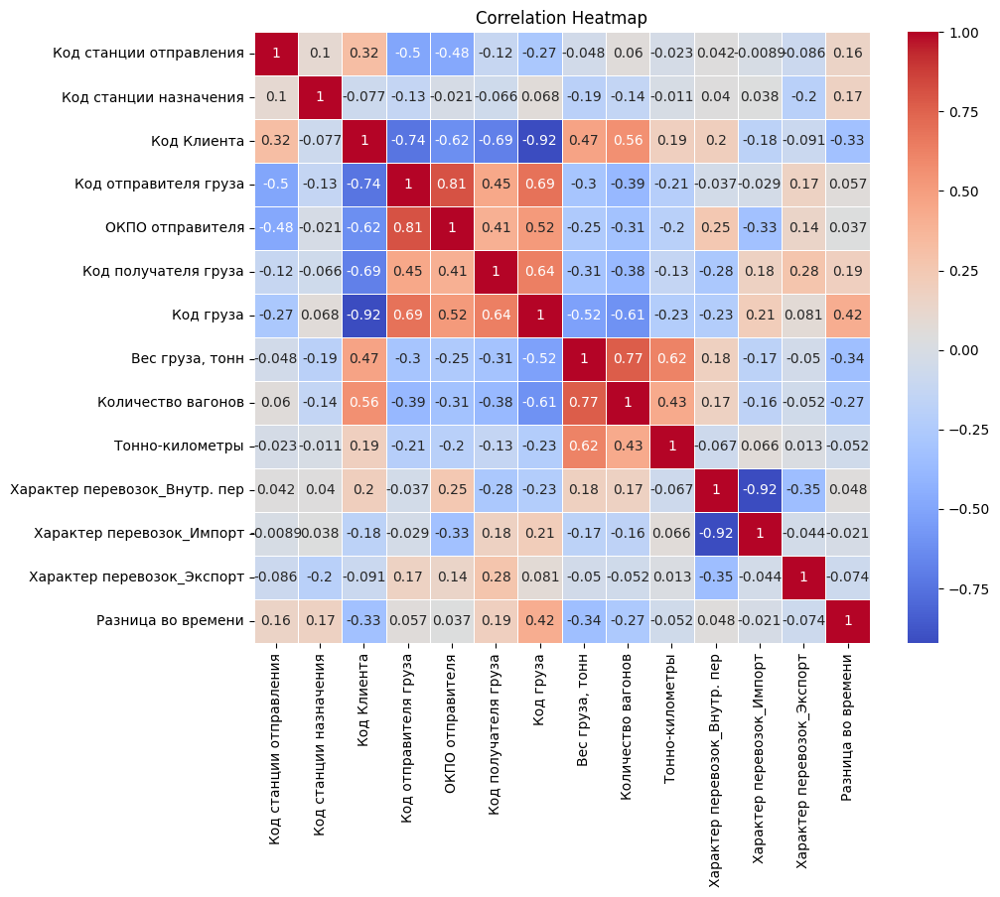

In [22]:
correlation_matrix = df_encoded.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", linewidths=.5)
plt.title("Correlation Heatmap")
plt.show()
#Построим матрицу корреляции

In [23]:
df_encoded

,Код станции отправления,Код станции назначения,Код Клиента,Код отправителя груза,ОКПО отправителя,Код получателя груза,Код груза,"Вес груза, тонн",Количество вагонов,Тонно-километры,Характер перевозок_Внутр. пер,Характер перевозок_Импорт,Характер перевозок_Экспорт,Разница во времени
399,23670,23670,1000108764,3431,85736056,3431,32307,26.342,1,527,True,False,False,2
505,23670,20810,1000108764,3431,85736056,9855,32307,26.395,1,19928,True,False,False,11
506,23670,19020,1000108764,3431,85736056,9855,32307,306.328,7,92817,True,False,False,3
507,23670,19020,1000108764,3431,85736056,9855,32307,219.025,5,66364,True,False,False,2
508,23670,19020,1000108764,3431,85736056,9855,32307,350.239,8,106123,True,False,False,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36008,20000,21580,7000094095,312,83262,263,32106,1080.000,24,152280,True,False,False,2
36009,20000,17440,7000094095,312,83262,289,32106,1768.000,34,788528,True,False,False,2
36010,20000,17440,7000094095,312,83262,289,32106,1560.000,30,695760,True,False,False,2
36011,23820,20000,7000094095,312,83262,312,32105,184.000,8,75992,True,False,False,1


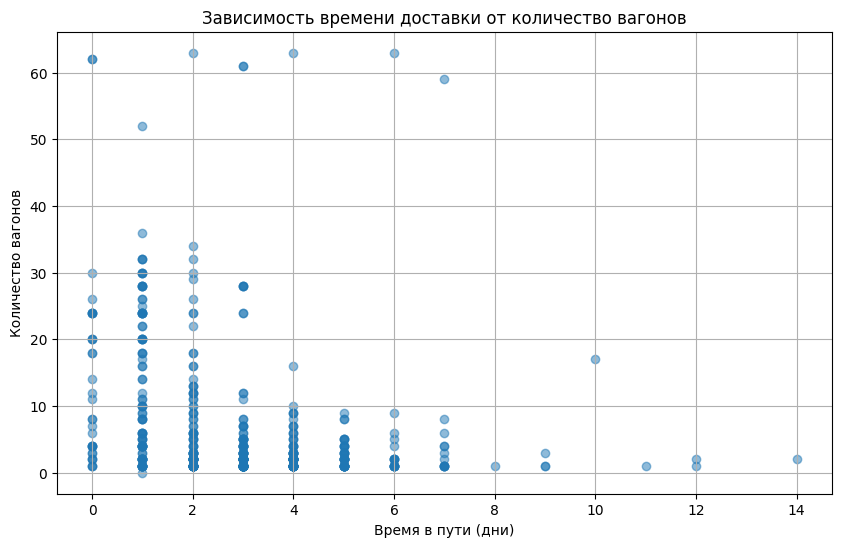

In [24]:
plt.figure(figsize=(10, 6))
plt.scatter(df_encoded['Разница во времени'], df_encoded['Количество вагонов'], alpha=0.5)
plt.title('Зависимость времени доставки от количество вагонов')
plt.xlabel('Время в пути (дни)')
plt.ylabel('Количество вагонов')
plt.grid(True)
plt.show()
#График зависимости от вес груза от времени в пути

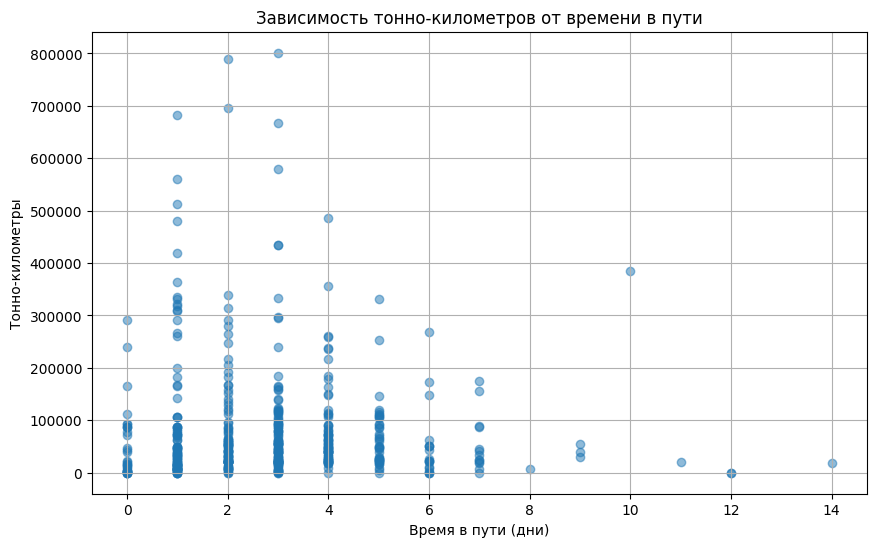

In [25]:
plt.figure(figsize=(10, 6))
plt.scatter(df_encoded['Разница во времени'], df_encoded['Тонно-километры'], alpha=0.5)
plt.title('Зависимость тонно-километров от времени в пути')
plt.xlabel('Время в пути (дни)')
plt.ylabel('Тонно-километры')
plt.grid(True)
plt.show()
#График зависимости тонно-километры от времени в пути

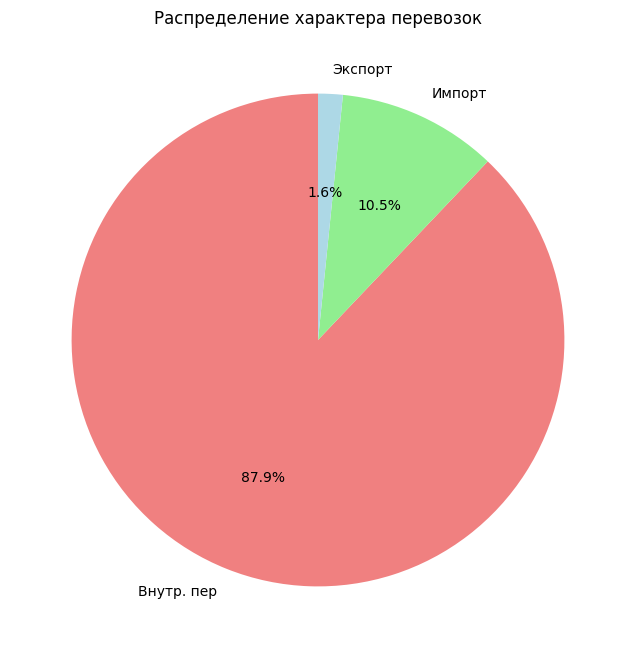

In [26]:
plt.figure(figsize=(8, 8))
df['Характер перевозок'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=['lightcoral', 'lightgreen', 'lightblue'])
plt.title('Распределение характера перевозок')
plt.ylabel('')
plt.show()

In [27]:
import ydata_profiling

ydata_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
X = df_encoded.drop(columns=['Разница во времени'])
y = (df_encoded['Разница во времени'] > 2).astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
#По условию задачи разделяю данные на основе того, будет ли доставка больше 2-х дней

In [29]:
print("Размер обучающего набора:", X_train.shape)
print("Размер тестового набора:", X_test.shape)
#Размерность наборов

Размер обучающего набора: (396, 13)
Размер тестового набора: (100, 13)


In [35]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from tpot.builtins import StackingEstimator
from tpot.export_utils import set_param_recursive
from sklearn.model_selection import RepeatedKFold
from tpot import TPOTClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
#Устанавливаем необходимые библиотеки

c:\Users\Пк\AppData\Local\Programs\Python\Python311\Lib\site-packages\tpot\builtins\__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


In [36]:
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
tpot = TPOTClassifier(
    generations=5,
    population_size=50,
    scoring='accuracy',
    cv=cv,
    verbosity=2,
    random_state=1,
    n_jobs=-1
)
#Параметры tpot

In [ ]:
tpot.fit(X_train, y_train)
#Обучаю auto-ml и получаем параметры лучшей модели

Optimization Progress:   0%|          | 0/300 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.8380555555555557

Generation 2 - Current best internal CV score: 0.8380982905982907

Generation 3 - Current best internal CV score: 0.8447649572649573

Generation 4 - Current best internal CV score: 0.8447863247863249

Generation 5 - Current best internal CV score: 0.8447863247863249

Best pipeline: RandomForestClassifier(ZeroCount(input_matrix), bootstrap=True, criterion=gini, max_features=0.45, min_samples_leaf=7, min_samples_split=20, n_estimators=100)


TPOTClassifier(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=10, random_state=1),
               generations=5, n_jobs=-1, population_size=50, random_state=1,
               scoring='accuracy', verbosity=2)

In [ ]:
best_model = RandomForestClassifier(bootstrap=True, criterion='gini', max_features=0.45, min_samples_leaf=7, min_samples_split=20, n_estimators=100)
best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)чя
print(f'Accuracy: {accuracy}')

y_train_pred = best_model.predict(X_train)
accuracy_train = accuracy_score(y_train, y_train_pred)
print(accuracy_train)
#По лучшей модели смотрим точность

Accuracy: 0.86
0.8737373737373737


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=30)
knn.fit(X_train, y_train)

y_hat = knn.predict(X_test)

accuracy = accuracy_score(y_test, y_hat)
print(f'Accuracy: {accuracy}')

y_train_pred = knn.predict(X_train)
accuracy_train = accuracy_score(y_train, y_train_pred)
print(accuracy_train)
#Проверяем точность на к соседях

Accuracy: 0.78
0.7449494949494949


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import accuracy_score

gb_classifier = GradientBoostingClassifier()

gb_classifier.fit(X_train, y_train)

y_pred = gb_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

y_train_pred = gb_classifier.predict(X_train)
accuracy_train = accuracy_score(y_train, y_train_pred)
print(accuracy_train)
#GradientBoostingClassifier

Accuracy: 0.87
0.9494949494949495


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

rf_classifier = RandomForestClassifier()

rf_classifier.fit(X_train, y_train)

y_pred = rf_classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

y_train_pred = rf_classifier.predict(X_train)
accuracy_train = accuracy_score(y_train, y_train_pred)
print(accuracy_train)
#RandomForestClassifier

Accuracy: 0.85
1.0


In [ ]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score

model = CatBoostClassifier(loss_function='Logloss')

model.fit(X_train, y_train, verbose=100)

# Получаем предсказания для тестовых данных
y_pred = model.predict(X_test)

# Рассчитываем точность
accuracy = accuracy_score(y_test, y_pred)
print(accuracy)

y_train_pred = model.predict(X_train)
accuracy_train = accuracy_score(y_train, y_train_pred)
print(accuracy_train)

Learning rate set to 0.006937
0:	learn: 0.6890370	total: 155ms	remaining: 2m 34s
100:	learn: 0.4302320	total: 394ms	remaining: 3.5s
200:	learn: 0.3526952	total: 583ms	remaining: 2.31s
300:	learn: 0.3088524	total: 783ms	remaining: 1.82s
400:	learn: 0.2823231	total: 1.06s	remaining: 1.58s
500:	learn: 0.2615917	total: 1.29s	remaining: 1.28s
600:	learn: 0.2441586	total: 1.5s	remaining: 998ms
700:	learn: 0.2288479	total: 1.74s	remaining: 742ms
800:	learn: 0.2150966	total: 1.96s	remaining: 486ms
900:	learn: 0.2022753	total: 2.21s	remaining: 243ms
999:	learn: 0.1902684	total: 2.48s	remaining: 0us
0.87
0.9267676767676768


In [ ]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score

svc = LinearSVC()

svc.fit(X_train, y_train)

y_pred = svc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

y_train_pred = svc.predict(X_train)
accuracy_train = accuracy_score(y_train, y_train_pred)
print(accuracy_train)

Accuracy: 0.53
0.43686868686868685


C:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [ ]:
import shap

#SHAP для моей лучшей модели (RandomForestClassifier)
explainer_model = shap.Explainer(rf_classifier)
shap_values_model = explainer_model.shap_values(X_test)

# SHAP для TPOT модели
explainer_tpot = shap.Explainer(best_model)
shap_values_tpot = explainer_tpot.shap_values(X_test)

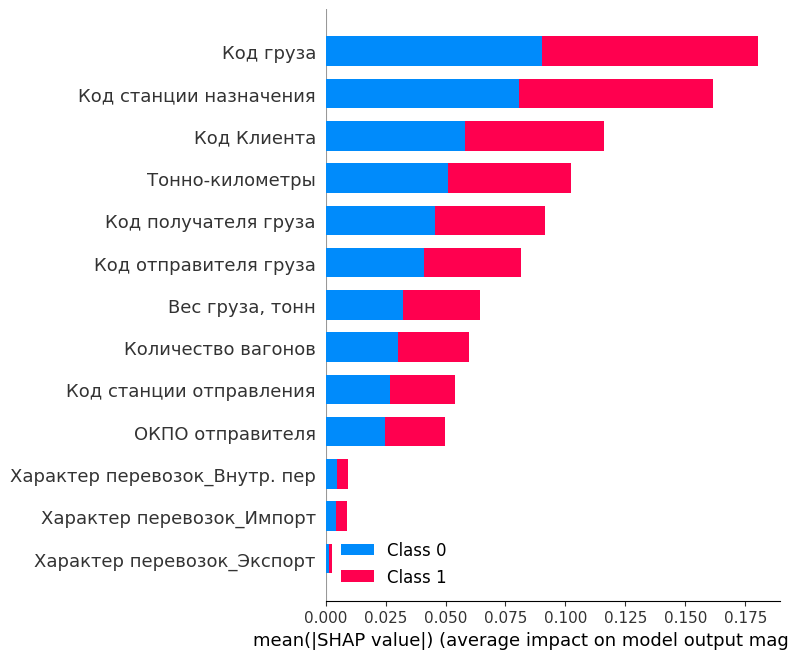

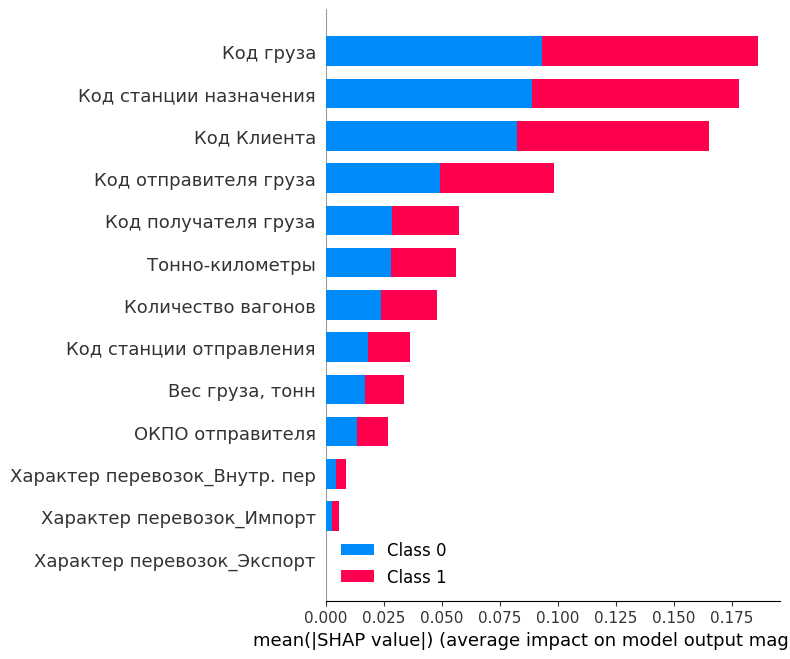

In [ ]:
# График для нашей модели
shap.summary_plot(shap_values_model, X_test, feature_names=df_encoded.columns, plot_type="bar")

# График для TPOT модели
shap.summary_plot(shap_values_tpot, X_test, feature_names=df_encoded.columns, plot_type="bar")
#Графики показывают важность каждого признака для обучения

In [ ]:
X_train

,Код станции отправления,Код станции назначения,Код Клиента,Код отправителя груза,ОКПО отправителя,Код получателя груза,Код груза,"Вес груза, тонн",Количество вагонов,Тонно-километры,Характер перевозок_Внутр. пер,Характер перевозок_Импорт,Характер перевозок_Экспорт
10043,18350,19450,1000231777,9061,72809061,1324,32411,69.152,1,20054,1,0,0
28303,20120,19440,1003776693,3437,0,5880,32411,202.715,3,162780,0,1,0
35908,18180,21000,7000094095,109,4733426,237,32106,2052.000,36,560196,1,0,0
33791,21060,20000,4000005180,2731,4945803,1581,32418,69.170,1,23725,1,0,0
28251,20120,19480,1003776693,3437,0,1240,32411,471.905,7,355817,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10123,18350,19980,1000231777,9061,72809061,5752,32411,68.376,1,24068,1,0,0
32311,21060,19980,1005918966,2731,4945803,1296,32418,67.010,1,25464,1,0,0
34235,23480,18820,7000000058,131,4724692,131,32411,0.268,1,106,1,0,0
35952,21000,23600,7000094095,237,1096574,109,32106,200.000,4,86400,1,0,0


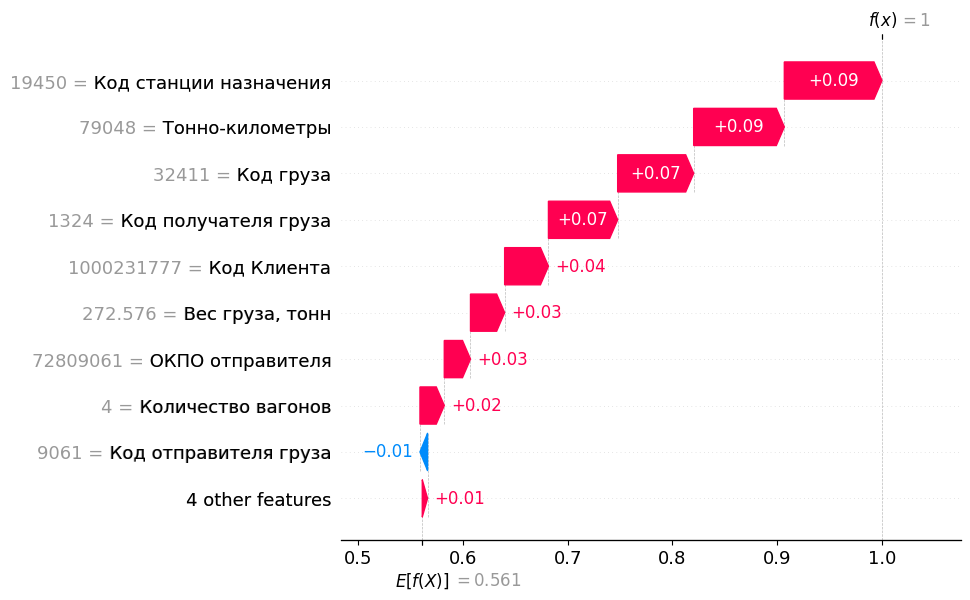

In [ ]:
import shap

row_number = 50  
class_to_visualize = 1  # Индекс класса, который визуализируем (0 или 1)

explainer = shap.Explainer(rf_classifier)
shap_values = explainer(X)

shap.plots.waterfall(shap_values[row_number][:, class_to_visualize])


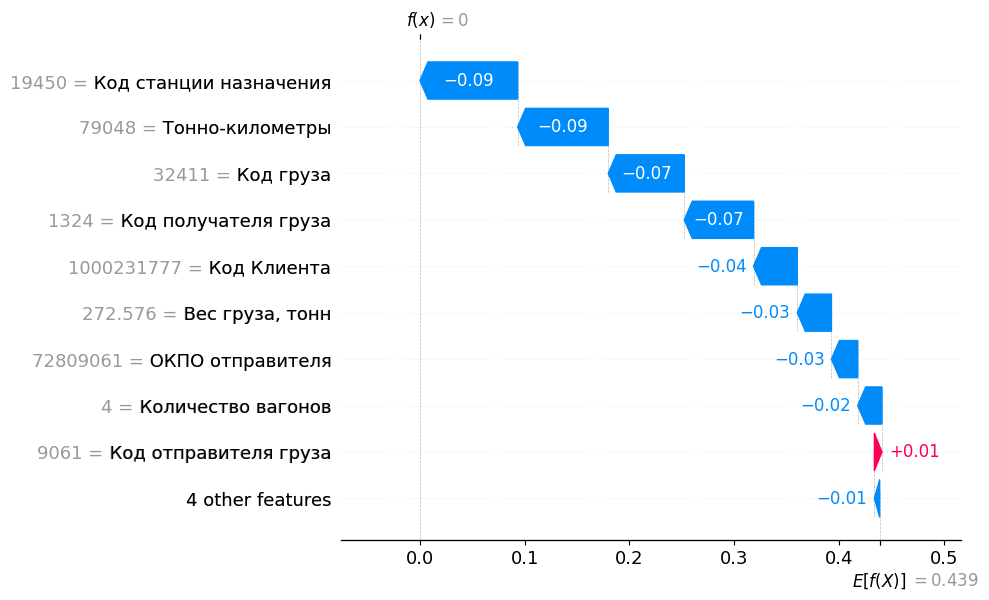

In [ ]:
import shap

row_number = 50  
class_to_visualize = 0  # Индекс класса, который визуализируем (0 или 1)

explainer = shap.Explainer(rf_classifier)
shap_values = explainer(X)

shap.plots.waterfall(shap_values[row_number][:, class_to_visualize])


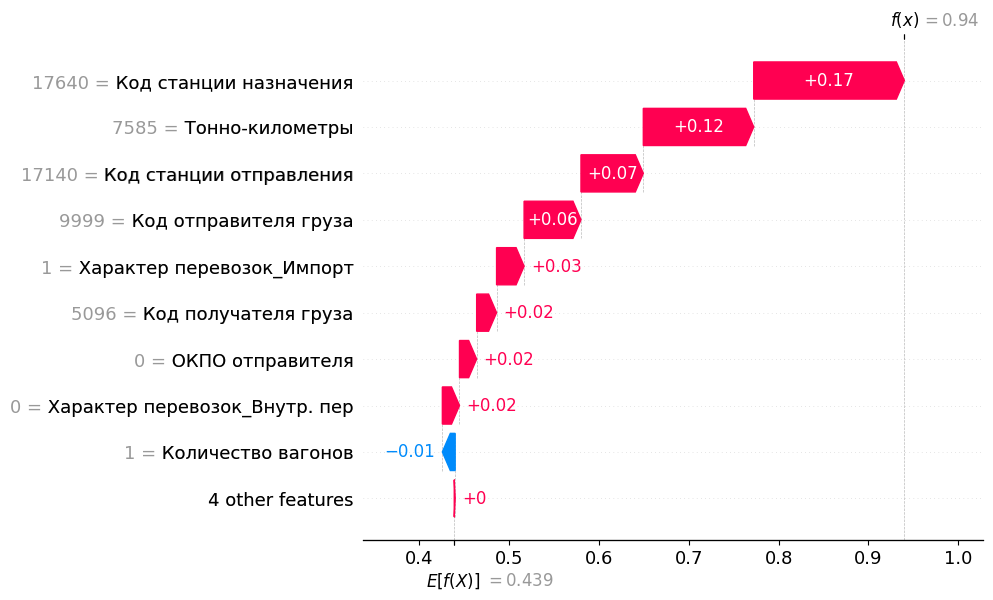

In [ ]:
import shap

row_number = 13
class_to_visualize = 0  # Индекс класса, который визуализируем (0 или 1)

explainer = shap.Explainer(rf_classifier)
shap_values = explainer(X)

shap.plots.waterfall(shap_values[row_number][:, class_to_visualize])


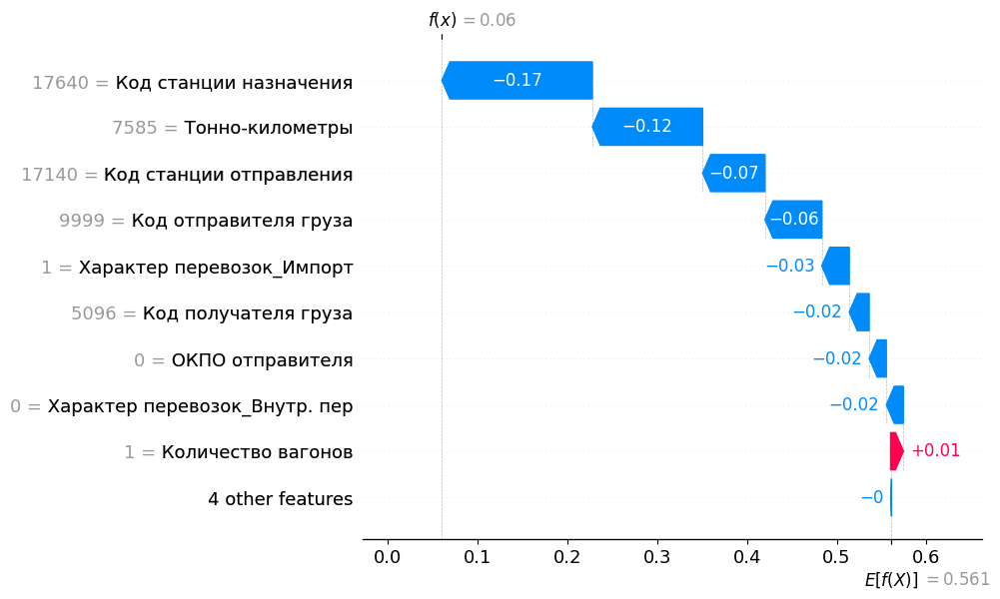

In [ ]:
import shap

row_number = 13
class_to_visualize = 1  # Индекс класса, который визуализируем (0 или 1)

explainer = shap.Explainer(rf_classifier)
shap_values = explainer(X)

shap.plots.waterfall(shap_values[row_number][:, class_to_visualize])


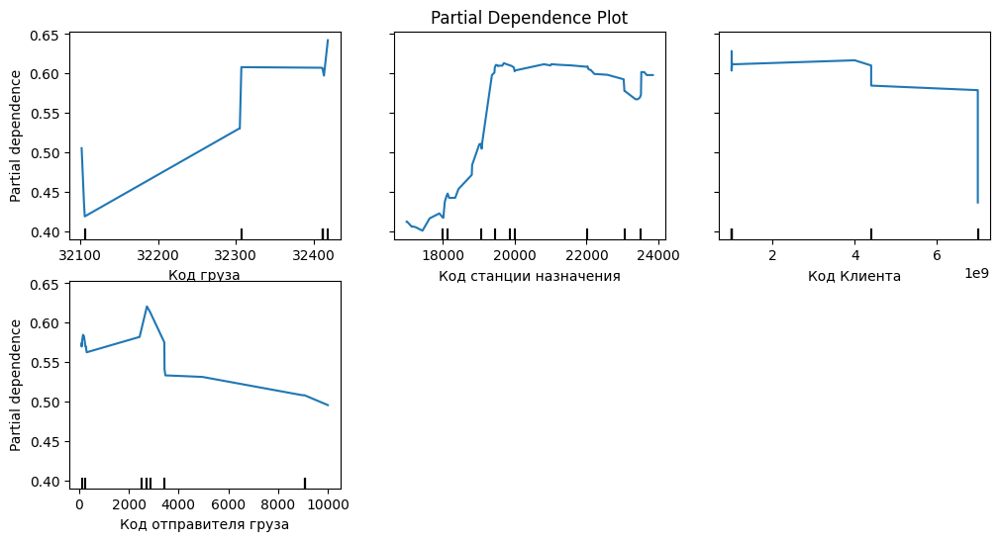

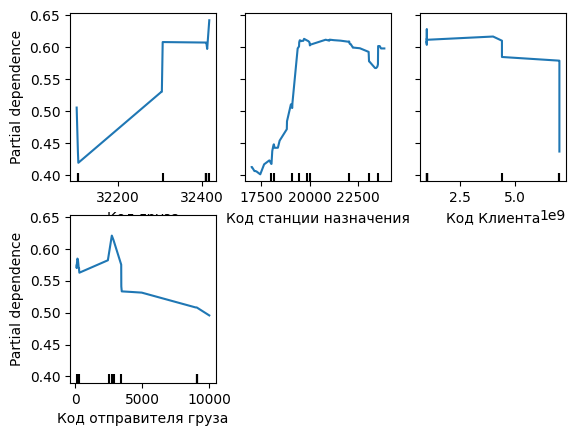

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
fix, ax = plt.subplots(figsize=(12, 6))

display = PartialDependenceDisplay.from_estimator(
    rf_classifier, X, ["Код груза", "Код станции назначения", "Код Клиента", "Код отправителя груза"], ax=ax
)

ax.set_title("Partial Dependence Plot")
display.plot()

In [ ]:
pip freeze

absl-py==1.3.0
aiosignal==1.3.1
antlr4-python3-runtime==4.9.3
anyio==3.7.1
argon2-cffi==21.3.0
argon2-cffi-bindings==21.2.0
arrow==1.2.3
asttokens==2.0.8
astunparse==1.6.3
async-lru==2.0.4
attrs==23.1.0
Babel==2.12.1
backcall==0.2.0
beautifulsoup4==4.11.1
black==22.10.0
bleach==6.0.0
cachetools==5.2.0
catboost==1.2.2
certifi==2022.9.24
cffi==1.15.1
charset-normalizer==2.1.1
clearml==1.7.1
click==8.0.4
cloudpickle==2.2.0
colorama==0.4.5
colour==0.1.5
comm==0.1.4
contourpy==1.0.5
cycler==0.11.0
Cython==0.29.32
dacite==1.8.1
dataclasses==0.6
deap==1.4.1
debugpy==1.6.7
decorator==5.1.1
defusedxml==0.7.1
distlib==0.3.7
dtreeviz==2.2.2
et-xmlfile==1.1.0
exceptiongroup==1.1.2
executing==1.1.1
fastjsonschema==2.18.0
filelock==3.12.4
fire==0.4.0
FLAML==2.1.0
flatbuffers==22.9.24
fonttools==4.37.4
fqdn==1.5.1
frozenlist==1.4.0
furl==2.1.3
future==0.18.2
fvcore==0.1.5.post20220512
gast==0.5.3
google-auth==2.13.0
google-auth-oauthlib==0.4.6
google-pasta==0.2.0
graphviz==0.20.1
grpcio==1.49.1
h2o==